In [79]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random
from torch.utils.data import Dataset
from torchvision import transforms
import torchvision
import torch
import numpy as np
from tqdm.notebook import tqdm
from collections import defaultdict
from sklearn.metrics import roc_curve, auc

In [2]:
torch.cuda.is_available()

True

In [3]:
dataset_folder = "./../../datasets/ball_pythons/"

In [4]:
main_folder_list = os.listdir(dataset_folder)
morph_folder_list = [f"{dataset_folder}{i}/" for i in main_folder_list if "%" not in i and "." not in i and "Pos" not in i]

In [5]:
morph_img_folder_dict = {}
for morph_folder in morph_folder_list:
    morph_img_folder_list = os.listdir(morph_folder)
    morph_img_folder_list = [f"{morph_folder}{i}/" for i in morph_img_folder_list]
    if len(morph_img_folder_list) > 50:
        morph_img_folder_dict[morph_folder.split("/")[-2]] = {"img_folders": morph_img_folder_list,
        "num_imgs": len(morph_img_folder_list)}

total imgs in dict: 11277 - 15 morphs


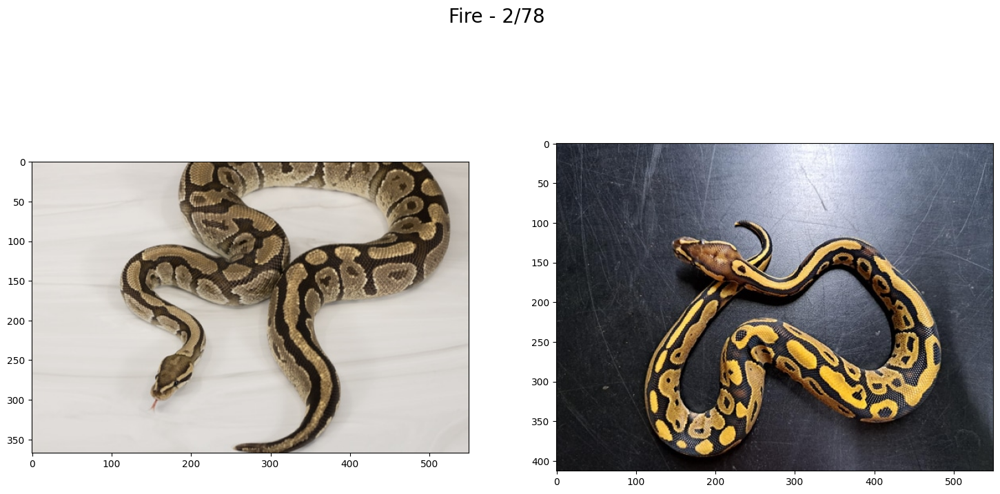

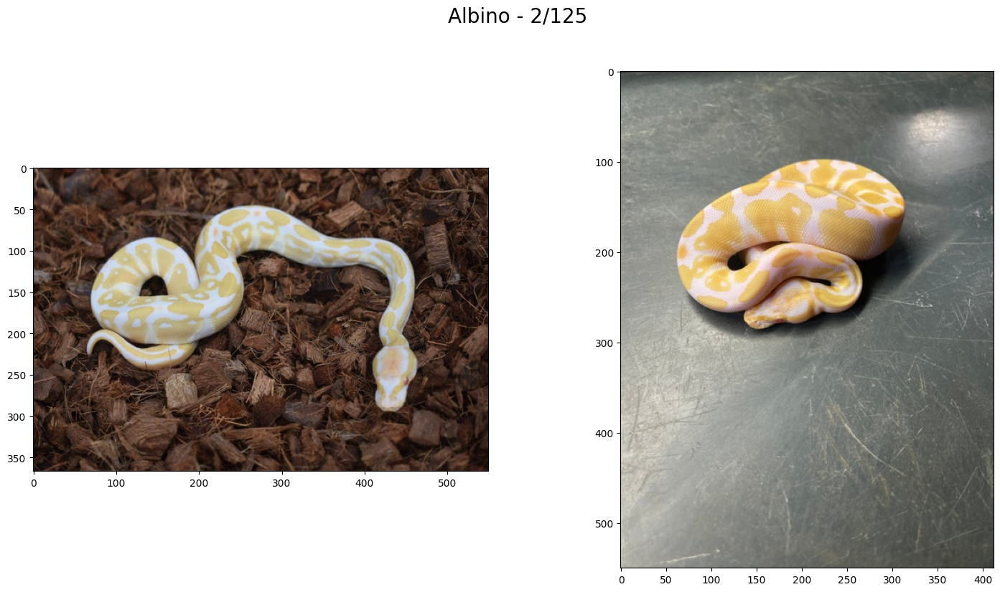

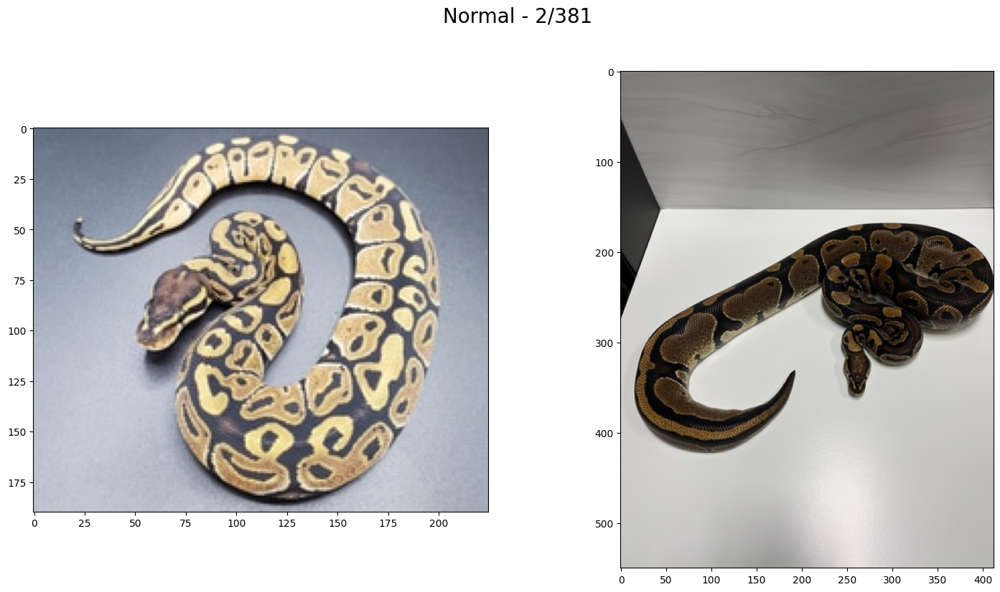

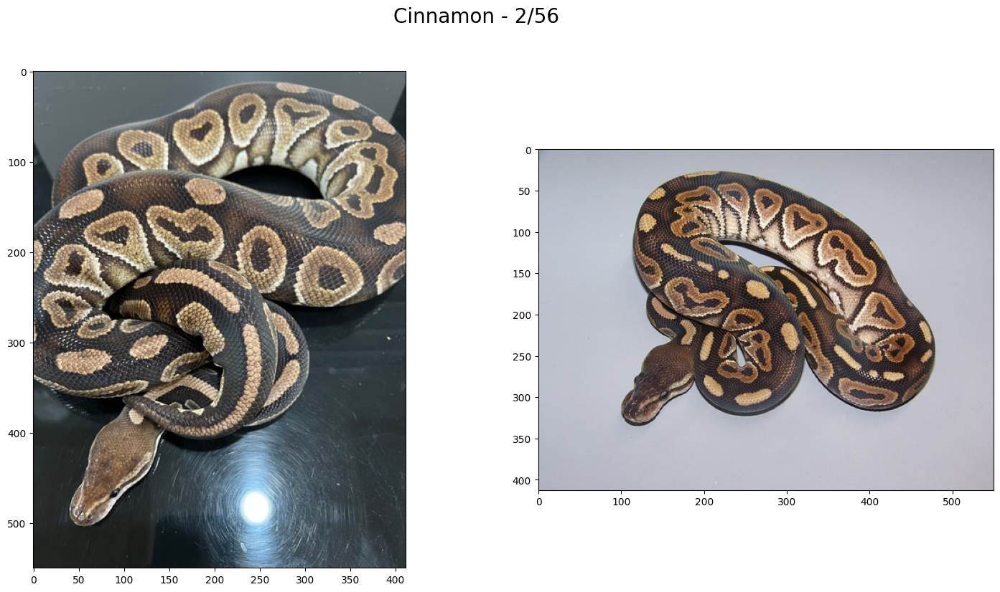

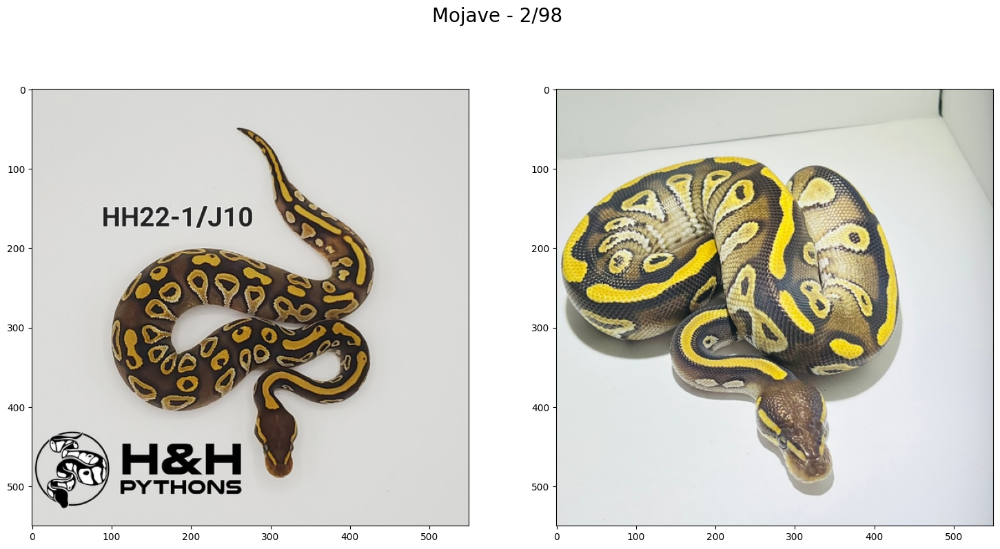

...

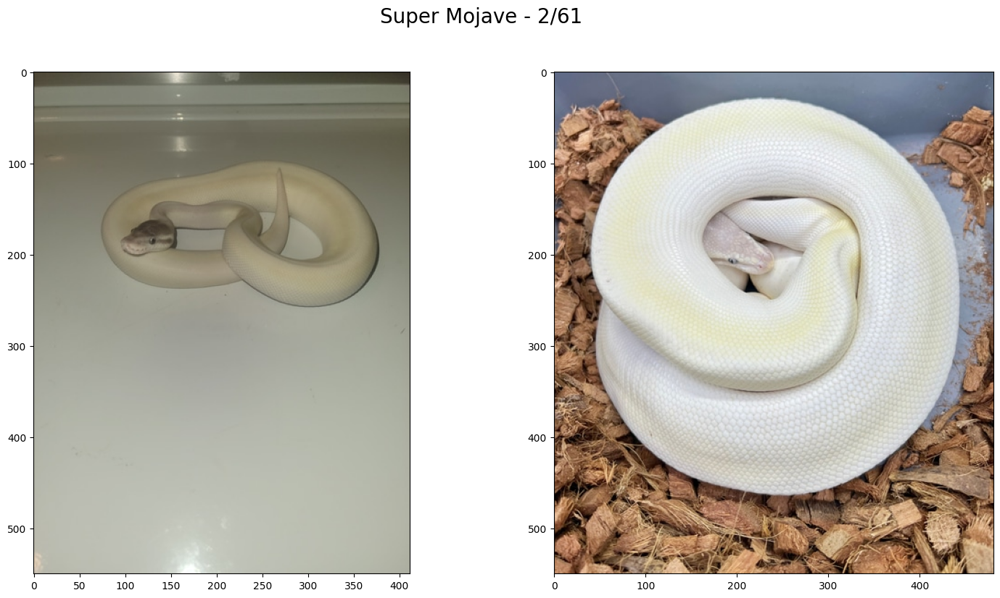

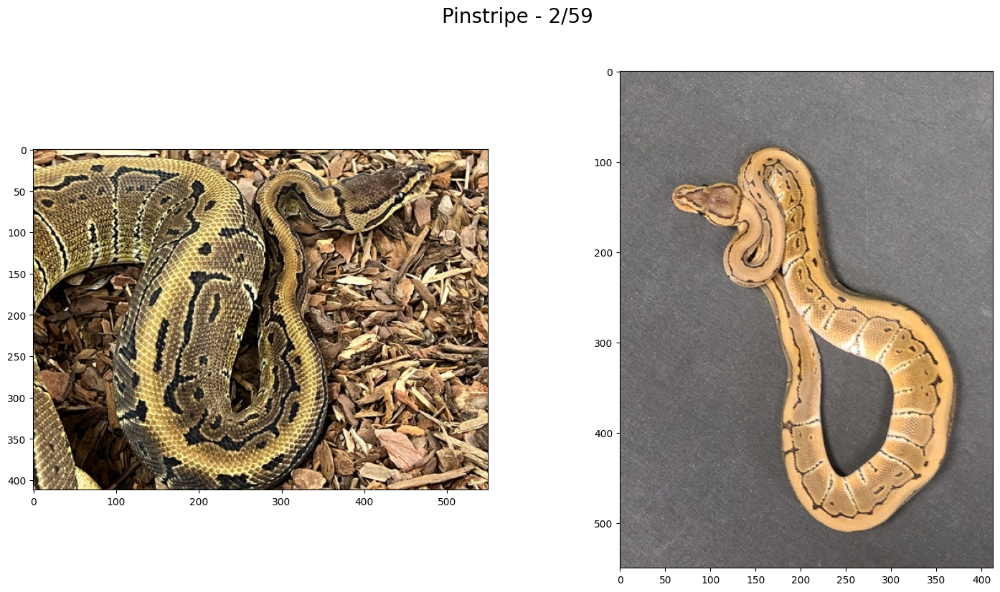

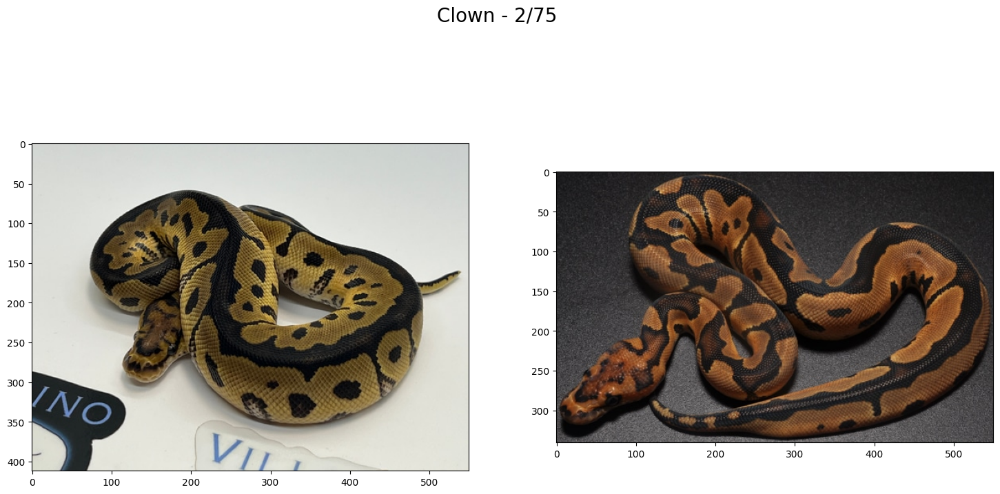

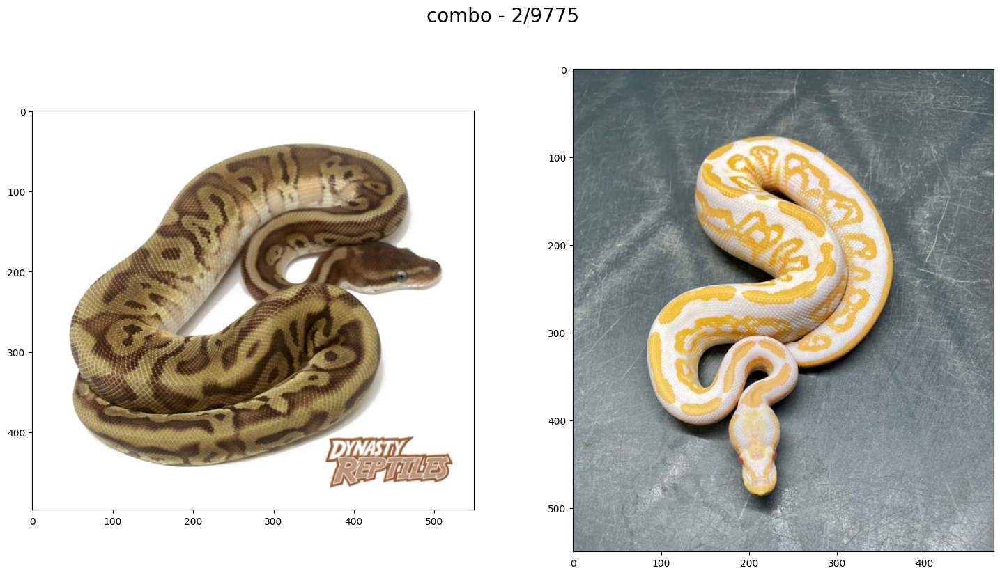

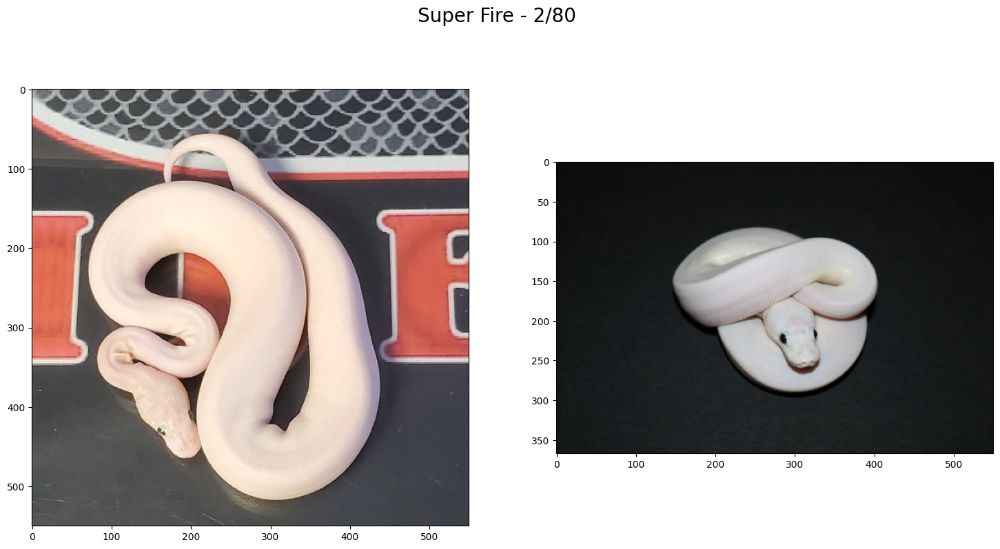

In [6]:
%matplotlib inline
total = 0
json_paths_list = []
for morph, morph_dict in morph_img_folder_dict.items():
    img_folder_list = morph_dict["img_folders"]
    image_paths = [[i+k for k in os.listdir(i) if k.endswith(".png")][0] for i in img_folder_list]
    json_paths = [[i+k for k in os.listdir(i) if k.endswith(".json")][0] for i in img_folder_list]
    json_paths_list.extend(json_paths)
    rand_samples = random.sample(image_paths,2)
    fig, ax = plt.subplots(ncols=2, figsize=(18,9))
    image = Image.open(rand_samples[0])
    ax[0].imshow(image)
    image = Image.open(rand_samples[1])
    ax[1].imshow(image)
    fig.suptitle(f"{morph} - 2/{morph_dict['num_imgs']}", fontsize=20)
    total += morph_dict["num_imgs"]
print(f"total imgs in dict: {total} - {len(morph_img_folder_dict)} morphs")

In [7]:
morph_details_dict = {}
all_image_details_dict = {}
for path in tqdm(json_paths_list):
    image_details_dict = {}
    cur_morph = path.split("/")[-3]
    if not morph_details_dict.get(cur_morph):
        morph_details_dict[cur_morph] = {}
    with open(path, "r") as f:
        image_details_dict = json.load(f)
        del image_details_dict["raw_details"]
    early_path = "/".join(path.split("/")[:-1])
    image_path = [f"{early_path}/{i}" for i in os.listdir(early_path) if not i.endswith(".json")][0]
    try:
        image = Image.open(image_path)
        image_details_dict["width"] = image.width
        image_details_dict["height"] = image.height
    except Exception as e:
        image_details_dict = {}
    if image_details_dict:
        morph_details_dict[cur_morph][image_path] = image_details_dict
        all_image_details_dict[image_path] = image_details_dict

  0%|          | 0/11277 [00:00<?, ?it/s]

In [8]:
metadata_df = pd.DataFrame.from_dict(all_image_details_dict, orient="index")
metadata_df = metadata_df.reset_index()
metadata_df = metadata_df.rename(columns={"index":"image_path"})

In [9]:
metadata_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,[Fire],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,[Fire],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,[Fire],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,[Fire],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,[Fire],NaN,US$85.00,550,413,2021,NaN


In [10]:
metadata_df.to_csv("./../../datasets/ball_pythons/dataset_metadata.csv", index=False)

In [11]:
test_df = pd.read_csv("./../../datasets/ball_pythons/dataset_metadata.csv")
test_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,['Fire'],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,['Fire'],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,['Fire'],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,['Fire'],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,['Fire'],NaN,US$85.00,550,413,2021,NaN


In [12]:
print(f"width - min: {metadata_df.width.min()} - median: {metadata_df.width.median()} - max: {metadata_df.width.max()}")
print(f"height - min: {metadata_df.height.min()} - median: {metadata_df.height.median()} - max: {metadata_df.height.max()}")

width - min: 155 - median: 550.0 - max: 550
height - min: 158 - median: 452.0 - max: 550


In [13]:
trait_list = []
for trait in metadata_df.traits.to_list():
    trait_list.extend(trait)

In [14]:
traits_dict = defaultdict(lambda: 0)
for trait in trait_list:
    traits_dict[trait] += 1

In [15]:
traits_dict = {k: v for k, v in sorted(traits_dict.items(), key=lambda item: item[1])}
traits_dict

{'Monarch': 1,
 '50% Het Moray': 1,
 'Smoke': 1,
 'Ajax': 1,
 'Alloy': 1,
 'Citron': 1,
 'Super Calico': 1,
 'Zuwadi': 1,
 '66% Het Monsoon': 1,
 'Mosaic': 1,
 '66% Het Orange Ghost': 1,
 'Black Belly': 1,
 'Super Phantom': 1,
 'Pos Het Caramel Albino': 1,
 'Super Bamboo': 1,
 'Super Spark': 1,
 '100% Het Axanthic (MJ)': 1,
 'Melt': 1,
 'Bling Yellow Belly': 1,
 'Super Nr Mandarin': 1,
 'Arcane': 1,
 'Axanthic (MJ)': 1,
 'Pos Het Moray': 1,
 'Marvel': 1,
 'Super Bongo': 1,
 'Satin': 1,
 'Super X-treme Gene': 1,
 '100% Het Axanthic (GCR)': 1,
 'KRG': 1,
 'Pastel Jungle': 1,
 'Jolt': 1,
 'Nyala': 1,
 'Cafe': 1,
 'Desert': 1,
 '100% Het Ghost (Vesper)': 1,
 'Super Scaleless Head': 1,
 '100% Het Green Ghost': 1,
 'Java': 1,
 'Paint': 1,
 'Super Cypress': 1,
 'Super Disco': 1,
 'Flare': 1,
 'Super Sapphire': 1,
 'Super Black': 1,
 'Lori': 1,
 'Super Asphalt': 2,
 'Super Sandblast': 2,
 '50% Het Monsoon': 2,
 'Pos Het Ghost (Vesper)': 2,
 '66% Het Tri-stripe': 2,
 'Super Red Stripe': 2,
 'Hy

In [29]:
class SquareCrop(object):
    def __init__(self):
        pass

    def __call__(self, tensor):
        longer_side = min(tensor.size)
        horizontal_padding = (longer_side - tensor.size[0]) / 2
        vertical_padding = (longer_side - tensor.size[1]) / 2
        cropped_tensor = tensor.crop((-horizontal_padding,
                        -vertical_padding,
                        tensor.size[0] + horizontal_padding,
                        tensor.size[1] + vertical_padding
                ))
        return cropped_tensor
    
    def __repr__(self):
        return self.__class__.__name__+'()'

In [17]:
def get_split(sample_array, split):
    np.random.seed(0)
    np.random.shuffle(sample_array)
    np.random.seed()
    if split == 'train':
        sample_array = sample_array[:int(len(sample_array)*0.7)]
    elif split == 'val':
        sample_array = sample_array[int(len(sample_array)*0.7):int(len(sample_array)*0.85)]
    elif split == 'test':
        sample_array = sample_array[int(len(sample_array)*0.85):]
    return list(sample_array)

In [18]:
def count_number_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [19]:
unique_traits = list(set(trait_list))
col_names = ["image_path"]
col_names.extend(unique_traits)
label_df = pd.DataFrame(columns=col_names)
# label_df = label_df.set_index("image_path")

In [20]:
label_df.head()

,image_path,66% Het Genetic Stripe,50% Het Orange Ghost,50% Het Sentinel,Caramel Albino,Orange Dream,Fader,Super Gravel,Mystic,Clown,...,Bald,100% Het Desert Ghost,100% Het Caramel Albino,Blade,Pos Het Ghost (Vesper),Harlequin,Stranger,Pos Ringer,50% Het Caramel Albino,Black Belly


In [21]:
# for ind, row in tqdm(metadata_df.iterrows(), total=len(metadata_df)):
#     label_row = [row['image_path']]
#     label_row.extend([1 if i in row['traits'] else 0 for i in unique_traits])
#     label_df.loc[len(label_df.index)] = label_row
label_df = pd.read_csv("./../../datasets/ball_pythons/label_data.csv")

In [22]:
label_df.sample(5)

,Unnamed: 0,image_path,50% Het Clown,Sugar,100% Het Hypo,Zuwadi,Disco,100% Het Enhancer,Super Nanny,GeneX,...,66% Het Cryptic,66% Het Desert Ghost,Lemon Pastel,Pos Het Orange Ghost,Super Red Stripe,Super Russo,Alloy,Super Vanilla,100% Het Axanthic (TSK),66% Het Monarch
6480,6480,./../../datasets/ball_pythons/combo/combo_d7d1...,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1880,1880,./../../datasets/ball_pythons/combo/combo_e5a4...,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5246,5246,./../../datasets/ball_pythons/combo/combo_c538...,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9617,9617,./../../datasets/ball_pythons/combo/combo_3160...,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7189,7189,./../../datasets/ball_pythons/combo/combo_500f...,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [76]:
class BallPythonDataset(Dataset):
    ##### Initialize the class #####
    def __init__(self, dataset_df, possible_traits, split = 'train'):
        ## Split parameter is used to specify which process the data is used for,
        ## and it can be 'train', 'val', and 'test
        
        self.set_of_finding_labels = possible_traits
        
        ## Get the list of all patient ids present in the dataset and split into
        ## training, validation and testing by patient id, but not by list of examples
        image_paths = pd.unique(dataset_df.index)
        selected_paths = get_split(image_paths, split)

        sample_df = dataset_df.loc[selected_paths]      
        
        sample_df = sample_df[["image_path"] + self.set_of_finding_labels]

        self.image_list = sample_df['image_path'].values
        self.targets = sample_df[self.set_of_finding_labels].values
        
        ## Define data augmentation transformations for the input images. In this exercise, we use the following
        ## transformations: square center cropping, resizing to 224x224 (to be similar as ImageNet dataset), 
        ## converting to tensor, normalizing per channel (i.e., R, G, and B) 
        ## with the average and standard deviation of images in the ImageNet dataset        
        self.set_of_transforms = transforms.Compose(
        [SquareCrop(),
         transforms.Resize(224),
         transforms.ToTensor(), 
         transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                 std=[0.5, 0.5, 0.5])])
        
    ##### Retrieve a sample with the corresponding index #####
    ## This function retrieve a sample from the dataset at the specified index 
    ## and returns an image and the corresponding label stored in Pytorch tensors     
    def __getitem__(self, index):
        curr_pil_image = Image.open(self.image_list[index])
        image_to_return = self.set_of_transforms(curr_pil_image)
                
        return image_to_return, torch.FloatTensor(self.targets[index])
    
    ##### Get the length of the dataset #####tm
    def __len__(self):
        return len(self.image_list)
    
    ##### Access the name of conditions in the labels #####
    def get_labels_name(self):
        return self.set_of_finding_labels

In [77]:
train_dataset = BallPythonDataset(label_df, unique_traits)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

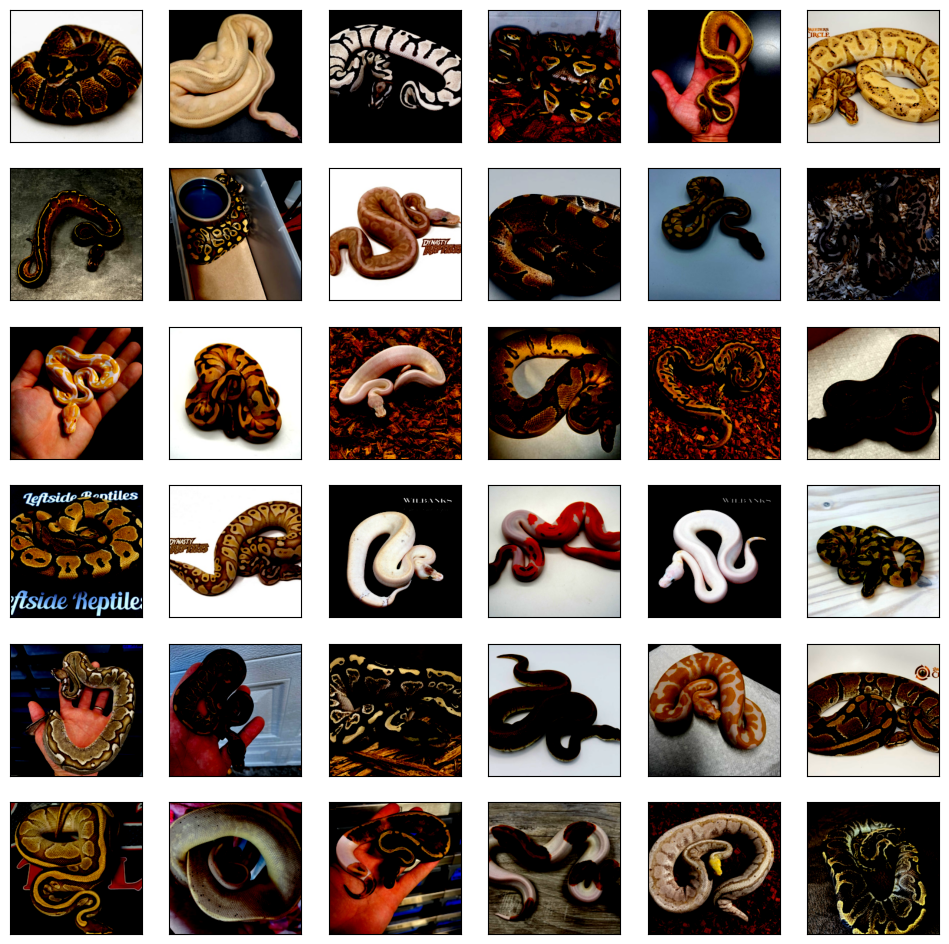

In [78]:
fig, ax = plt.subplots(ncols = 6, nrows = 6, figsize=(12,12))
j = 0
for i, rand_ind in enumerate(random.sample(list(range(len(train_dataset))), 36)):
    k = i % 6
    img, targ = train_dataset[rand_ind]
    ax[j,k].imshow(img.permute(1,2,0).detach())
    ax[j,k].set_xticks([])
    ax[j,k].set_yticks([])
    if k == 5:
        j += 1

In [57]:
trait_freq = np.sum(train_dataset.targets, axis=0)/len((train_dataset))
for i, trait_name in enumerate(unique_traits):
    print(f"{trait_name} - {round(trait_freq[i]*100, 4)}%")

66% Het Genetic Stripe - 0.1903%
50% Het Orange Ghost - 0.0888%
50% Het Sentinel - 0.0%
Caramel Albino - 0.0381%
Orange Dream - 5.189%
Fader - 0.1269%
Super Gravel - 0.0381%
Mystic - 0.6724%
Clown - 7.9295%
66% Het Tri-stripe - 0.0127%
Super Special - 0.0254%
100% Het Orange Crush - 0.0634%
66% Het Orange Ghost - 0.0127%
Joppa - 0.0254%
Pos Het Moray - 0.0127%
Paint - 0.0127%
Pos Het Axanthic (VPI) - 0.1015%
Sugar - 0.3552%
Mosaic - 0.0%
Super Enchi - 0.7105%
100% Het Toffee - 0.1649%
Orange Belly - 0.0381%
Super Mojave - 0.6978%
Mojave - 9.3758%
Arcane - 0.0127%
100% Het Axanthic (Jolliff) - 0.0254%
Furrow - 0.1142%
Spider - 5.798%
50% Het Albino - 0.4948%
Axanthic (MJ) - 0.0127%
Super GHI - 0.3933%
Desert Ghost - 1.256%
50% Het Ultramel - 0.1522%
50% Het Sunset - 0.0127%
Het Red Axanthic - 0.6344%
Calico - 1.3702%
Banana - 12.7379%
66% Het Piebald - 0.9135%
66% Het Lavender Albino - 0.1396%
100% Het Axanthic (MJ) - 0.0127%
Static - 0.0381%
Yellow Belly - 9.4012%
Super Nr Mandarin - 0

In [25]:
##### Request a GPU #####
## This function locates an available gpu for usage. In addition, this function reserves a specificed
## memory space exclusively for your account. The memory reservation prevents the decrement in computational
## speed when other users try to allocate memory on the same gpu in the shared systems, i.e., CADE machines. 
## Note: If you use your own system which has a GPU with less than 4GB of memory, remember to change the 
## specified mimimum memory.
def define_gpu_to_use(minimum_memory_mb = 8000):    
    thres_memory = 600 #
    gpu_to_use = None
    try: 
        os.environ['CUDA_VISIBLE_DEVICES']
        print('GPU already assigned before: ' + str(os.environ['CUDA_VISIBLE_DEVICES']))
        return
    except:
        pass
    
    torch.cuda.empty_cache()
    for i in range(16):
        free_memory = !nvidia-smi --query-gpu=memory.free -i $i --format=csv,nounits,noheader
        if free_memory[0] == 'No devices were found':
            break
        free_memory = int(free_memory[0])
        
        if free_memory>minimum_memory_mb-thres_memory:
            gpu_to_use = i
            break
            
    if gpu_to_use is None:
        print('Could not find any GPU available with the required free memory of ' + str(minimum_memory_mb) \
              + 'MB. Please use a different system for this assignment.')
    else:
        os.environ['CUDA_VISIBLE_DEVICES'] = str(gpu_to_use)
        print('Chosen GPU: ' + str(gpu_to_use) + f" with {free_memory}MB free")
        x = torch.rand((256,1024,minimum_memory_mb-thres_memory)).cuda()
        x = torch.rand((1,1)).cuda()        
        del x
        
## Request a gpu and reserve the memory space
define_gpu_to_use()

Chosen GPU: 0with 10168MB free


In [80]:
##### Calculate AUC metric #####
## This function compute AUC from the given input arrays i.e., predicted value and ground truth arrays
def auroc(logits_predicted, target):
    fpr, tpr, _ = roc_curve(target, logits_predicted)
    return auc(fpr, tpr)

##### Compute AUC of a given dataset #####
## This function takes a model and Pytorch data loader as input. 
## The given model is used to predict the expected label for each sample in the Pytorch data loader. The 
## model output for each sample is an array with 14 elements corresponding with 14 conditions in the 
## ChestXray14 dataset. Then, the AUC is computed for each condition.
def get_score_model_chestxray_binary_model(model, data_loader):
    ## Toggle model to eval mode
    model.eval()
    
    ## Iterate through the dataset and perform inference for each sample.
    ## Store inference results and target labels for AUC computation 
    with torch.no_grad():
        
        logits_predicted = np.zeros([0, 14])
        targets = np.zeros([0, 14])
        ## Iterate through the dataset and perform inference for each sample.
        ## Store inference results and target labels for AUC computation  
        for image, target in data_loader:
            image = image.cuda()
            logit_predicted = model(image)
            logits_predicted = np.concatenate((logits_predicted, logit_predicted.cpu().detach().numpy())\
                                              , axis = 0)
            targets = np.concatenate((targets, target.cpu().detach().numpy()), axis = 0)
            
    ## Return a list of auc values in which each value corresponds to one of the 14 labels
    return [auroc(logits_predicted[:,i], targets[:,i]) for i in range(len(unique_traits))]

In [81]:
train_dataset = BallPythonDataset(label_df, unique_traits, 'train')
val_dataset = BallPythonDataset(label_df, unique_traits, 'val')
test_dataset = BallPythonDataset(label_df, unique_traits, 'test')

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=24, num_workers=12)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=24, num_workers=12)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=24, num_workers=12)

In [82]:
resnet18_pretrain = torchvision.models.resnet18(pretrained=True)

resnet18_finetune = resnet18_pretrain
num_ftrs = resnet18_finetune.fc.in_features
resnet18_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))

/home/jordan/github/ball_python_project/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jordan/github/ball_python_project/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/jordan/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]